In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
import os

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split 
from sklearn import linear_model, preprocessing 

In [2]:
dfe = pd.read_csv('Data.csv')
df = dfe[dfe['genre'] == 'Blues']

In [3]:
df.describe()

,Unnamed: 0,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,...,duration_ms_zscore_zscore_zscore,energy_zscore_zscore_zscore,instrumentalness_zscore_zscore_zscore,liveness_zscore_zscore_zscore,loudness_zscore_zscore_zscore,speechiness_zscore_zscore_zscore,tempo_zscore_zscore_zscore,valence_zscore_zscore_zscore,lognorm_duration_zscore_zscore_zscore,Count_zscore_zscore_zscore
count,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,...,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000,9353.000000
mean,38992.042339,54.659040,0.163175,0.541843,232554.443601,0.706616,0.054340,0.195015,-6.526668,0.086489,...,-0.045080,0.497519,-0.319993,-0.113435,0.509434,-0.175408,0.156371,0.023677,0.060963,-0.007972
std,21964.492509,7.848148,0.239840,0.147102,59700.999502,0.205312,0.166410,0.152907,2.751152,0.089542,...,0.487406,0.765389,0.544578,0.754975,0.444651,0.463366,0.971527,0.836521,0.660268,0.512125
min,258.000000,0.000000,0.000001,0.061700,16640.000000,0.048400,0.000000,0.011900,-23.548000,0.022900,...,-1.807832,-1.956270,-0.497823,-1.017558,-2.241613,-0.504473,-2.282460,-1.580787,-6.499091,-0.583152
25%,23470.000000,50.000000,0.002230,0.444000,197000.000000,0.556000,0.000000,0.098700,-8.009000,0.035400,...,-0.335350,-0.063968,-0.497823,-0.588986,0.269854,-0.439787,-0.652026,-0.623425,-0.274722,-0.407276
50%,39463.000000,54.000000,0.035000,0.539000,224720.000000,0.741000,0.000055,0.132000,-6.000000,0.050700,...,-0.109041,0.625700,-0.497644,-0.424568,0.594556,-0.360612,0.094067,-0.034930,0.056851,-0.178104
75%,41801.000000,59.000000,0.232000,0.641000,259333.000000,0.884000,0.004610,0.254000,-4.522000,0.093300,...,0.173544,1.158796,-0.482737,0.177803,0.833435,-0.140163,0.836983,0.607415,0.417655,0.290899
max,82611.000000,86.000000,0.989000,0.971000,656493.000000,0.998000,0.959000,0.981000,1.342000,0.949000,...,3.416007,1.583781,2.640515,3.767341,1.781195,4.287966,3.133899,2.076729,2.756896,1.841808


In [4]:
cols = df.columns

allpop = dfe[dfe.popular == 'popular']
pop = df[df.popular == 'popular']
nonpop = df[df.popular == 'not-popular']
print(df.corr())
print(pop.corr())
print(nonpop.corr())

                                       Unnamed: 0  popularity  acousticness  \
Unnamed: 0                               1.000000    0.381719      0.000718   
popularity                               0.381719    1.000000      0.008995   
acousticness                             0.000718    0.008995      1.000000   
danceability                             0.005597    0.072513      0.140091   
duration_ms                             -0.021328    0.018547     -0.059336   
energy                                  -0.007142   -0.014754     -0.672140   
instrumentalness                        -0.031751   -0.042744      0.004607   
liveness                                -0.016128   -0.024753     -0.065486   
loudness                                 0.016879    0.015273     -0.553405   
speechiness                             -0.019689   -0.027554      0.096668   
tempo                                   -0.020951   -0.042662     -0.156728   
valence                                  0.003634   

AxesSubplot(0.125,0.125;0.62x0.755)


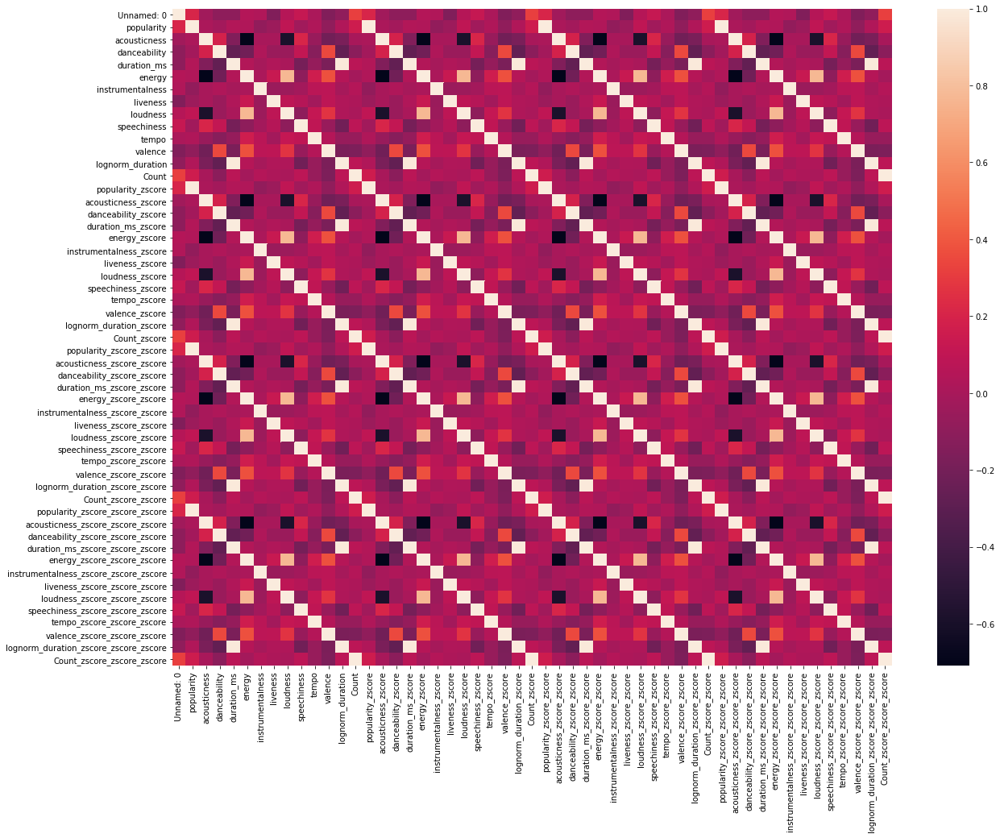

In [5]:
plt.subplots(figsize=(20,15))

m = sns.heatmap(pop.corr())
print(m)
n = sns.pairplot(data=pop)
print(n)

In [23]:
#plt.subplots(figsize=(20,15))

#m = sns.heatmap(nonpop.corr())
#print(m)
#p = sns.pairplot(data=nonpop)
#print(p)

<ErrorbarContainer object of 3 artists>

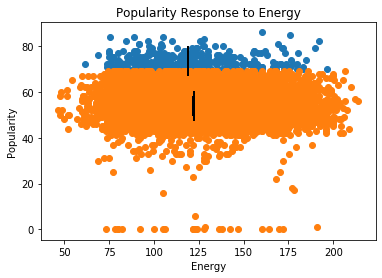

In [7]:
plt.scatter(pop.tempo, pop.popularity)
plt.scatter(nonpop.tempo, nonpop.popularity)
plt.xlabel("Energy")
plt.ylabel("Popularity")
plt.title("Popularity Response to Energy")

plt.errorbar(np.mean(pop.tempo),np.mean(pop.popularity),xerr=np.std(pop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.tempo),np.mean(nonpop.popularity),xerr=np.std(nonpop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

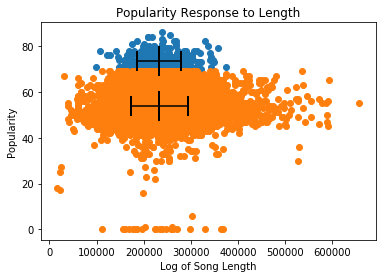

In [8]:
plt.scatter(pop.duration_ms, pop.popularity)
plt.scatter(nonpop.duration_ms, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Length")

plt.errorbar(np.mean(pop.duration_ms),np.mean(pop.popularity),xerr=np.std(pop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.duration_ms),np.mean(nonpop.popularity),xerr=np.std(nonpop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

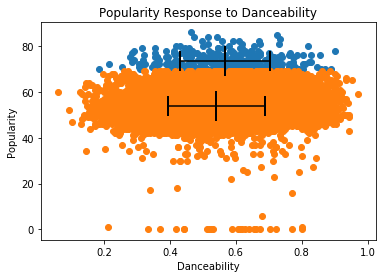

In [9]:
plt.scatter(pop.danceability, pop.popularity)
plt.scatter(nonpop.danceability, nonpop.popularity)
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.title("Popularity Response to Danceability")

plt.errorbar(np.mean(pop.danceability),np.mean(pop.popularity),xerr=np.std(pop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.danceability),np.mean(nonpop.popularity),xerr=np.std(nonpop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

ValueError: x and y must be the same size

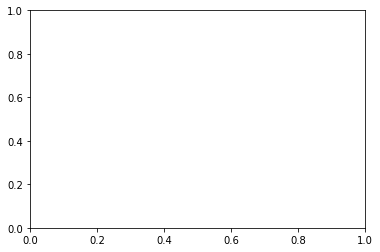

In [13]:
plt.scatter(pop.count, pop.popularity)
plt.scatter(nonpop.count, nonpop.popularity)
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.title("Popularity Response to Count")

plt.errorbar(np.mean(pop.count),np.mean(pop.popularity),xerr=np.std(pop.count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.count),np.mean(nonpop.popularity),xerr=np.std(nonpop.count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

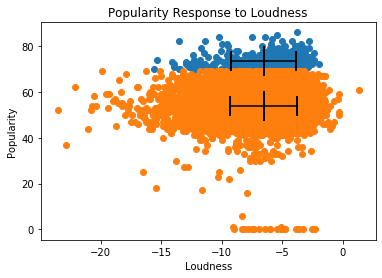

In [14]:
plt.scatter(pop.loudness, pop.popularity)
plt.scatter(nonpop.loudness, nonpop.popularity)
plt.xlabel("Loudness")
plt.ylabel("Popularity")
plt.title("Popularity Response to Loudness")

plt.errorbar(np.mean(pop.loudness),np.mean(pop.popularity),xerr=np.std(pop.loudness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.loudness),np.mean(nonpop.popularity),xerr=np.std(nonpop.loudness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

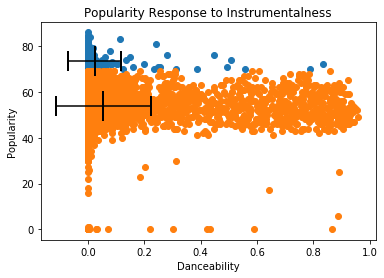

In [16]:
plt.scatter(pop.instrumentalness, pop.popularity)
plt.scatter(nonpop.instrumentalness, nonpop.popularity)
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.title("Popularity Response to Instrumentalness")

plt.errorbar(np.mean(pop.instrumentalness),np.mean(pop.popularity),xerr=np.std(pop.instrumentalness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.instrumentalness),np.mean(nonpop.popularity),xerr=np.std(nonpop.instrumentalness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

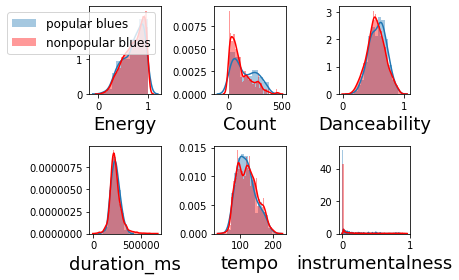

In [20]:

plt.subplot(231)
sns.distplot(pop.energy, label='popular blues')
sns.distplot(nonpop.energy, color='r', label='nonpopular blues')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(nonpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(nonpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(nonpop.duration_ms, color='r')
plt.xlabel('duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.tempo)
sns.distplot(nonpop.tempo, color='r')
plt.xlabel('tempo', fontsize=18)

plt.subplot(236)
sns.distplot(pop.instrumentalness)
sns.distplot(nonpop.instrumentalness, color='r')
plt.xlabel('instrumentalness', fontsize=18)

plt.tight_layout()
plt.show()


/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


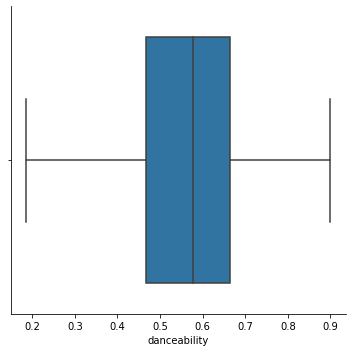

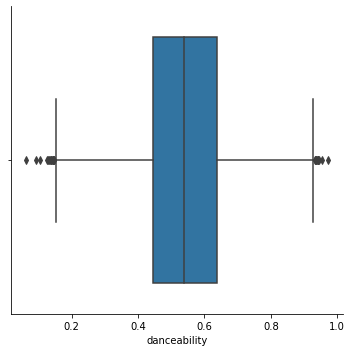

In [18]:
sns.factorplot(x='danceability', data=pop, kind='box')
sns.factorplot(x='danceability', data=nonpop, kind='box')
plt.show()

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


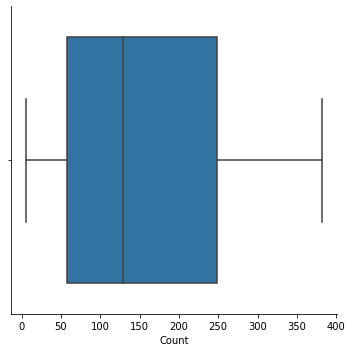

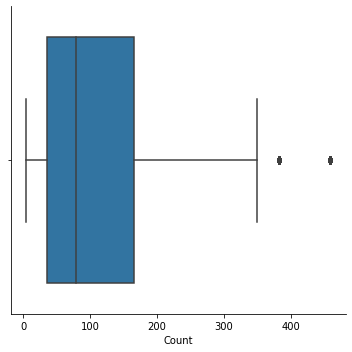

In [19]:
sns.factorplot(x='Count', data=pop, kind='box')


sns.factorplot(x='Count', data=nonpop, kind='box')
plt.show()

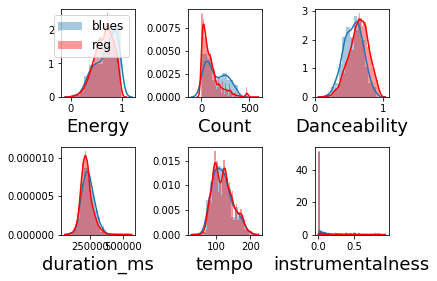

In [22]:


plt.subplot(231)
sns.distplot(pop.energy, label='blues')
sns.distplot(allpop.energy, color='r', label='reg')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(allpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(allpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(allpop.duration_ms, color='r')
plt.xlabel('duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.tempo)
sns.distplot(allpop.tempo, color='r')
plt.xlabel('tempo', fontsize=18)

plt.subplot(236)
sns.distplot(pop.instrumentalness)
sns.distplot(allpop.instrumentalness, color='r')
plt.xlabel('instrumentalness', fontsize=18)



plt.tight_layout()
plt.show()
